# MACHINE LEARNING FUNDAMENTALS
### TELECOM CUSTOMER CHURN PREDICTION
### ZAKRIA SAAD (202202038)
### COURSE INSTRUCTOR: ALI EL SHARIF

### SETTING UP THE ENVIRONMENT

In [26]:
import numpy as np # linear algebra
import pandas as pd # data processing
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pandas_profiling.profile_report as report
import plotly
import plotly.graph_objs as go
import plotly.express as px
import plotly.graph_objects as go
from plotly import offline
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')


In [2]:
df=pd.read_csv('telecom_customer_churn.csv')

In [3]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Data Preprocessing 
#### Formating column names  

In [4]:
df.columns=df.columns.str.replace(" ","").str.lower()

#### Dealing with Nulls

In [5]:
df.avgmonthlylongdistancecharges=df.avgmonthlylongdistancecharges.fillna(0.0)

In [6]:
df.multiplelines=df.multiplelines.fillna('no phone service')

In [7]:
no_internet=['internettype','onlinesecurity','onlinebackup','deviceprotectionplan','premiumtechsupport','streamingtv',
             'streamingmovies','streamingmusic','unlimiteddata']
df[no_internet]=df[no_internet].fillna('no internet service')

##### Made a list of features with the info related to customers that used internet service and filling the nulls by "no internet service" for those who were not using internet services of the company

In [8]:
df.avgmonthlygbdownload=df.avgmonthlygbdownload.fillna(0)

In [9]:
df=df.drop(columns=['churnreason','churncategory'])

##### Drop Churn Reason and Churn Category features because they are not related to the scope of the problem and they wont be showing the impact on the target variable since the only give the reason that why the particular customer left the company

In [10]:
# Checking for missing values
df.isnull().sum()

customerid                       0
gender                           0
age                              0
married                          0
numberofdependents               0
city                             0
zipcode                          0
latitude                         0
longitude                        0
numberofreferrals                0
tenureinmonths                   0
offer                            0
phoneservice                     0
avgmonthlylongdistancecharges    0
multiplelines                    0
internetservice                  0
internettype                     0
avgmonthlygbdownload             0
onlinesecurity                   0
onlinebackup                     0
deviceprotectionplan             0
premiumtechsupport               0
streamingtv                      0
streamingmovies                  0
streamingmusic                   0
unlimiteddata                    0
contract                         0
paperlessbilling                 0
paymentmethod       

In [11]:
df=df.loc[~df.customerstatus.str.contains('Join')]
df.reset_index(drop=True,inplace=True)

#### Droping the customers that recently joined the company so to avoid any kind of biasness I drop the rows that were related to new customer information

## Exploratory Data Analysis

In [12]:
df.customerstatus.value_counts()

Stayed     4720
Churned    1869
Name: customerstatus, dtype: int64

In [13]:
df.customerstatus[df.customerstatus=='Churned'].groupby(by=df.gender).count()

gender
Female    939
Male      930
Name: customerstatus, dtype: int64

In [14]:
df.customerstatus[df.customerstatus=='Stayed'].groupby(by=df.gender).count()

gender
Female    2338
Male      2382
Name: customerstatus, dtype: int64

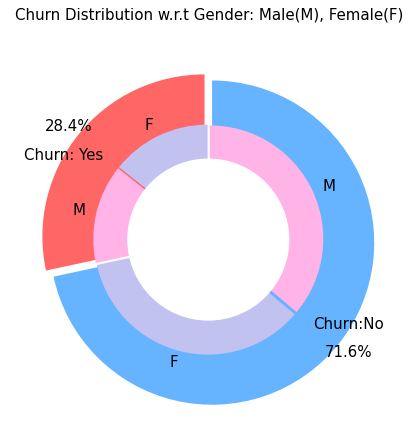

In [15]:
plt.figure(figsize=(6, 6))
labels =["Churn: Yes","Churn:No"]
values = [1869,4720]
labels_gender = ["F","M","F","M"]
sizes_gender = [939,930 , 2338,2382]
colors = ['#ff6666', '#66b3ff']
colors_gender = ['#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6']
explode = (0.3,0.3) 
explode_gender = (0.1,0.1,0.1,0.1)
textprops = {"fontsize":15}
#Plot
plt.pie(values, labels=labels,autopct='%1.1f%%',pctdistance=1.08, labeldistance=0.8,colors=colors, startangle=90,frame=True, explode=explode,radius=10, textprops =textprops, counterclock = True, )
plt.pie(sizes_gender,labels=labels_gender,colors=colors_gender,startangle=90, explode=explode_gender,radius=7, textprops =textprops, counterclock = True, )
#Draw circle
centre_circle = plt.Circle((0,0),5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title('Churn Distribution w.r.t Gender: Male(M), Female(F)', fontsize=15, y=1.1)

# show plot 
 
plt.axis('equal')
plt.tight_layout()
plt.show()

In [16]:
fig = px.histogram(df, x="customerstatus", color = "contract", barmode = "group", title = "<b>Customer contract distribution<b>")
fig.update_layout(width=700, height=500, bargap=0.2)
fig.show()

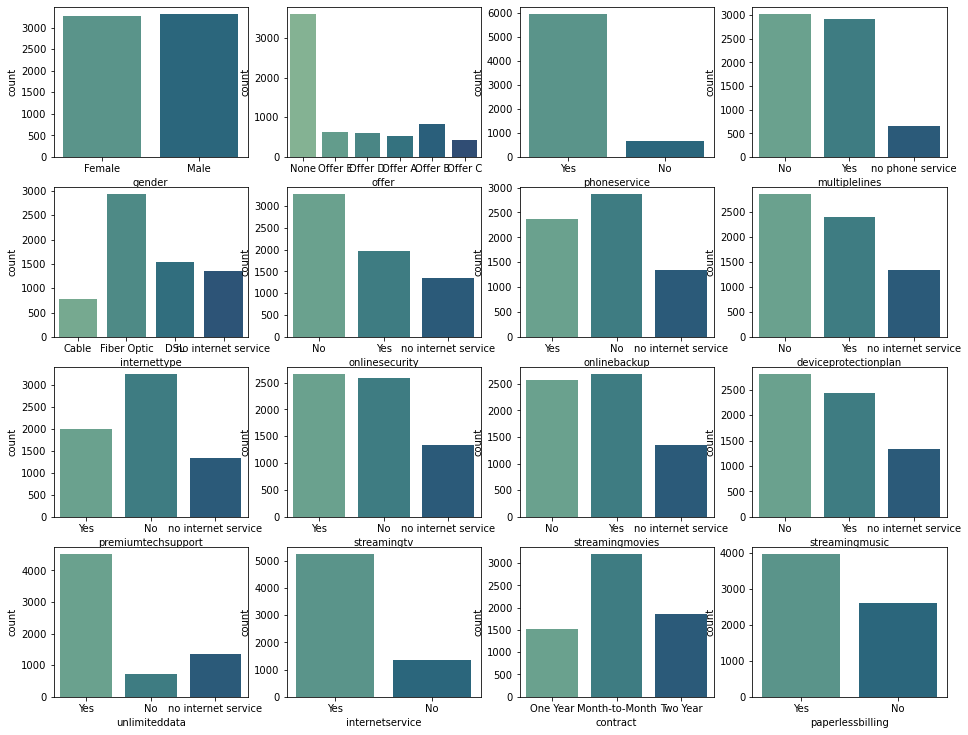

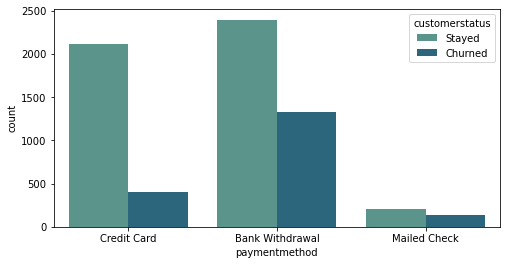

<Figure size 432x288 with 0 Axes>

In [17]:
cat_cols = ['gender','offer','phoneservice','multiplelines','internettype',
            'onlinesecurity','onlinebackup','deviceprotectionplan',
            'premiumtechsupport','streamingtv','streamingmovies','streamingmusic',
            'unlimiteddata','internetservice',
            'contract', 'paperlessbilling']

plt.figure(figsize=(16, 16))
for n, variable in enumerate(cat_cols):
    ax = plt.subplot(5, 4, n + 1)
    g=sns.countplot(data=df, x=df[variable], ax=ax, palette='crest')
plt.show() 
plt.figure(figsize=(8,4))
_ = sns.countplot(x= 'paymentmethod', hue='customerstatus', data=df, palette='crest')
plt.show() 
plt.tight_layout()


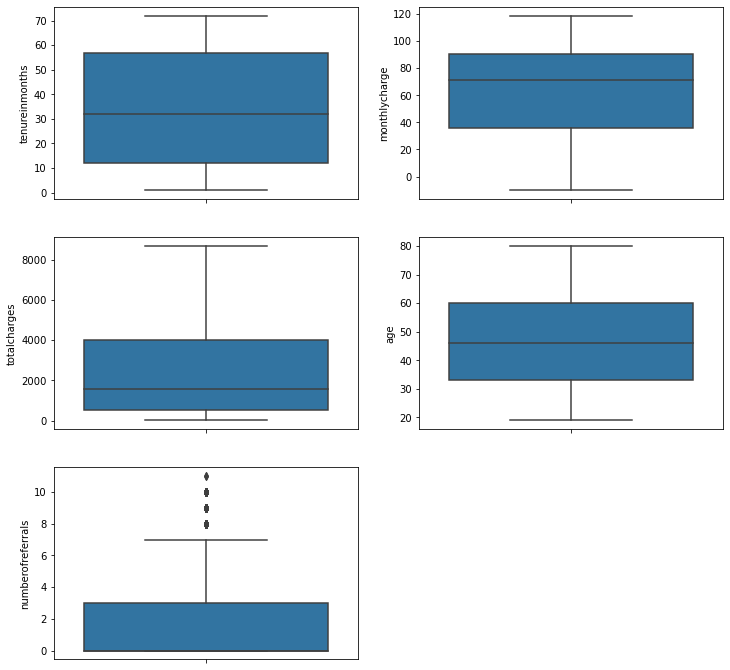

In [18]:
plt.figure(figsize=(12,12))
plt.subplot(3, 2, 1)
_ = sns.boxplot(y= df['tenureinmonths'])
plt.subplot(3, 2, 2)
_ = sns.boxplot(y= df['monthlycharge'])
plt.subplot(3, 2, 3)
_ = sns.boxplot(y= df['totalcharges'])
plt.subplot(3, 2, 4)
_ = sns.boxplot(y= df['age'])
plt.subplot(3, 2, 5)
_ = sns.boxplot(y= df['numberofreferrals'])



In [20]:
fig = px.box(df, x='customerstatus', y = 'tenureinmonths')

# Update yaxis properties
fig.update_yaxes(title_text='Tenure (Months)', row=1, col=1)
# Update xaxis properties
fig.update_xaxes(title_text='Churn', row=1, col=1)

# Update size and title
fig.update_layout(autosize=True, width=750, height=600,
    title_font=dict(size=25, family='Courier'),
    title='<b>Tenure vs Churn</b>',
)

fig.show()